**DS-UA 202 Responsible Data Science, Spring 2021**

**Code for Home Credit Loan Repayment ADS Nutrition Label**

> Erin Choi, Vicky Lin

> May 10, 2021

Any sections labeled with "ADS" contain code and text directly from the notebook where we found the ADS. All other sections ("added for report" or no specific label) were added by us for this project.

**Directions for running:** after authenticating and creating the PyDrive client to import the data, all cells can just be run as normal. Any cells meant to produce output such as computed metrics or graphs should do so automatically.

The original ADS is from [this](https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction/) solution on Kaggle competitions.







# ADS: Import packages and functions

In [ ]:
import numpy as np
import pandas as pd 

# sklearn preprocessing for dealing with categorical variables
from sklearn.preprocessing import LabelEncoder

# File system manangement
import os

# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')

# matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
!pip install -U -q PyDrive
  
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
  
  
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# ADS: Load and read the data

In [ ]:
link_train = 'https://drive.google.com/file/d/1tEDrTXo3g3_FDhtq4r32iR9RIahaC6rI/view?usp=sharing'
# to get the id part of the file
id = link_train.split("/")[-2]
  
downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('application_train.csv')  
  
app_train = pd.read_csv('application_train.csv')
app_train.head(10)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,...,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,...,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,...,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,-16941,-1588,-4970.0,-477,NaN,1,1,1,1,1,0,Laborers,2.0,2,2,WEDNESDAY,16,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-2536.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
6,100009,0,Cash loans,F,Y,Y,1,171000.0,1560726.0,41301.0,1395000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.035792,-13778,-3130,-1213.0,-619,17.0,1,1,0,1,1,0,Acco

In [ ]:
link_test = 'https://drive.google.com/file/d/1HFHglGByn1Py89KXw-eH4js8gOLZeDH_/view?usp=sharing'
# to get the id part of the file
id2 = link_test.split("/")[-2]
downloaded = drive.CreateFile({'id':id2}) 
downloaded.GetContentFile('application_test.csv')  
  
app_test = pd.read_csv('application_test.csv')
app_test.head(10)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,...,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,...,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.026392,-13976,-1866,-2000.0,-4208,NaN,1,1,0,1,1,0,Sales staff,4.0,2,2,WEDNESDAY,11,0,0,0,0,0,0,Business Entity Type 3,...,0.2446,0.3739,0.0388,0.0817,reg oper account,block of flats,0.3700,Panel,No,0.0,0.0,0.0,0.0,-1805.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010032,-13040,-2191,-4000.0,-4262,16.0,1,1,1,1,0,0,NaN,3.0,2,2,FRIDAY,5,0,0,0,0,1,1,Business Entity Type 3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-821.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
5,100042,Cash loans,F,Y,Y,0,270000.0,959688.0,34600.5,810000.0,Unaccompanied,State servant,Secondary / secondary special,Married,House / apartment,0.025164,-18604,-12009,-6116.0,-2027,10.0,1,1,0,1,1,0,Drivers,2.0,2,2,MONDAY,15,0,0,0,0,0,0,Government,...,0.1975,0.2258,0.0116,0.0746,not specified,block of flats,0.2151,Block,No,0.0,0.0,0.0,0.0,-1705.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,2.0
6,100057,Cash loans,M,Y,Y,2,180000.0,499221.0,22117.5,373500.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.022800,-16685,-2580,-10125.0,-241,

# ADS: Data Pre-processing and Exploration


## ADS: Examine data and missing values

In [ ]:
## examine the target variable in the training data
## Target Variable: 0 for the loan was repaid on time, or a 1 indicating the client had payment difficulties
app_train['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

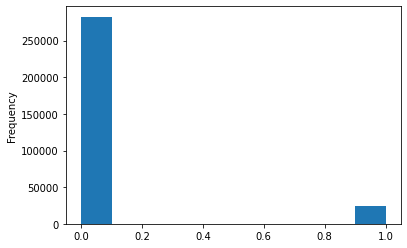

In [ ]:
#Target varible distribution of the training data
app_train['TARGET'].astype(int).plot.hist()

In [ ]:
##Examine the missing/invalid data in the dataset

##Function to examine the invalid data in every column
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [ ]:
# Missing values statistics
missing_values = missing_values_table(app_train)
missing_values.head(20)

Your selected dataframe has 122 columns.
There are 67 columns that have missing values.


,Missing Values,% of Total Values
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


In [ ]:
# Number of each type of column
app_train.dtypes.value_counts()

float64    65
int64      41
object     16
dtype: int64

In [ ]:
# Number of unique classes in each object column
app_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

## Added for report: missing values information, additional distributions for some input features

In [ ]:
# Missing values for the external sources
print(missing_values.loc[['EXT_SOURCE_1']])
print(missing_values.loc[['EXT_SOURCE_2']])
print(missing_values.loc[['EXT_SOURCE_3']])

# features for age, gender, income, and education were not included
# in the missing_values dataframe, indicating there are no missing values
# for these features.

              Missing Values  % of Total Values
EXT_SOURCE_1          173378               56.4
              Missing Values  % of Total Values
EXT_SOURCE_2             660                0.2
              Missing Values  % of Total Values
EXT_SOURCE_3           60965               19.8


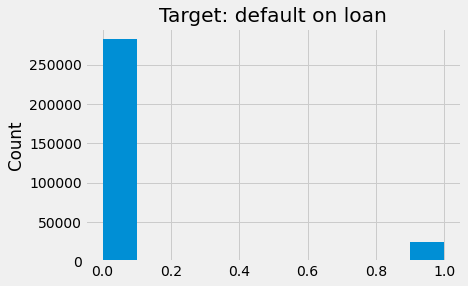

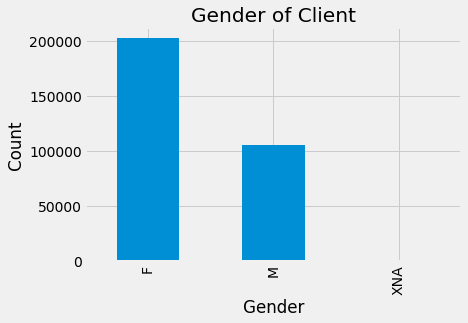

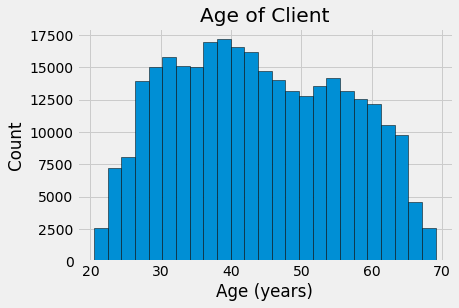

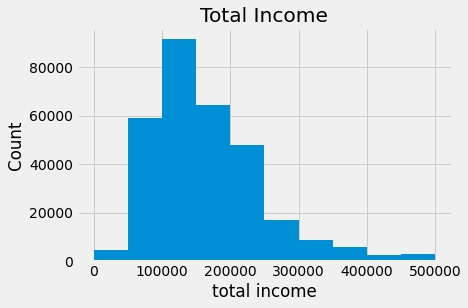

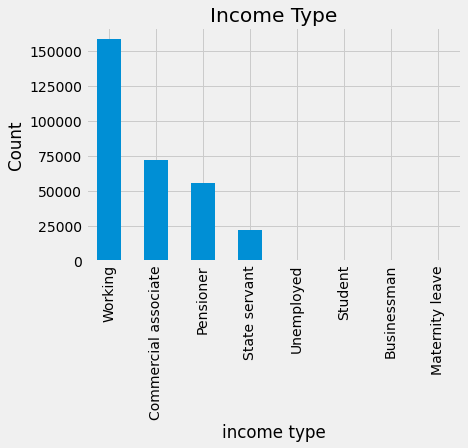

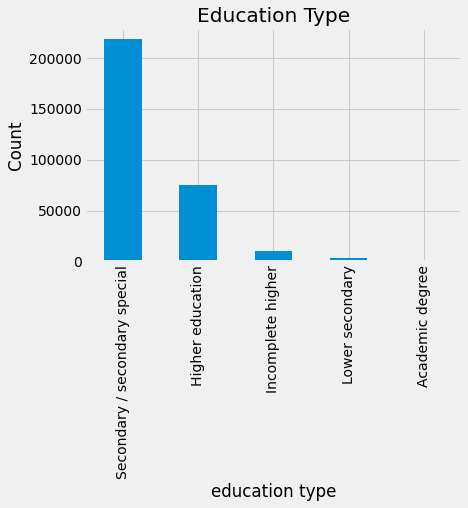

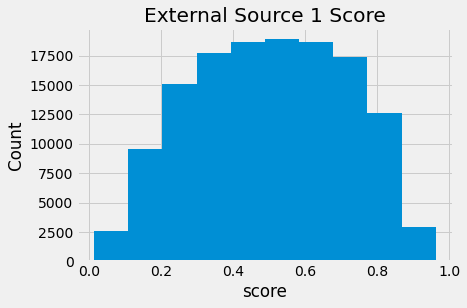

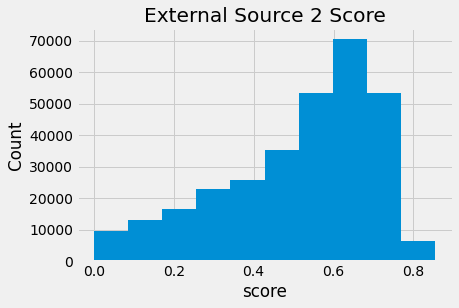

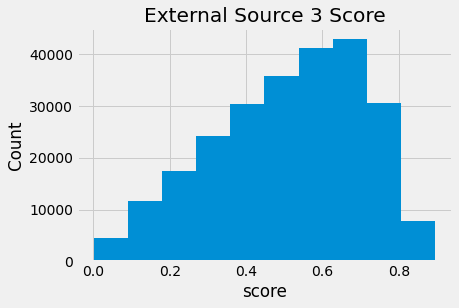

In [ ]:
# distributions for some attributes of our choice
plt.style.use('fivethirtyeight')

plt.hist(app_train['TARGET'])
plt.title('Target: default on loan'); plt.ylabel('Count');
plt.show()

app_train['CODE_GENDER'].value_counts().plot(kind='bar')
plt.title('Gender of Client');plt.xlabel('Gender'); plt.ylabel('Count');
plt.show()

plt.hist(abs(app_train['DAYS_BIRTH'] /365), edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');
plt.show()

plt.hist(app_train['AMT_INCOME_TOTAL'],range=(0, 500000))
plt.title('Total Income'); plt.xlabel('total income'); plt.ylabel('Count');
plt.show()

app_train['NAME_INCOME_TYPE'].value_counts().plot(kind='bar')
plt.title('Income Type'); plt.xlabel('income type'); plt.ylabel('Count');
plt.show()

app_train['NAME_EDUCATION_TYPE'].value_counts().plot(kind='bar')
plt.title('Education Type'); plt.xlabel('education type'); plt.ylabel('Count');
plt.show()


plt.hist(app_train['EXT_SOURCE_1'])
plt.title('External Source 1 Score');plt.xlabel('score'); plt.ylabel('Count');
plt.show()

plt.hist(app_train['EXT_SOURCE_2'])
plt.title('External Source 2 Score');plt.xlabel('score'); plt.ylabel('Count');
plt.show()

plt.hist(app_train['EXT_SOURCE_3'])
plt.title('External Source 3 Score');plt.xlabel('score'); plt.ylabel('Count');
plt.show()

In [ ]:
#there are outliers in the income that are not shown in the plot above
app_train['AMT_INCOME_TOTAL'].max()

117000000.0

## ADS: Encoding Categorical Data

In [ ]:
# Create a label encoder object
le = LabelEncoder()
le_count = 0

# Iterate through the columns
for col in app_train:
    if app_train[col].dtype == 'object':
        # If 2 or fewer unique categories
        if len(list(app_train[col].unique())) <= 2:
            # Train on the training data
            le.fit(app_train[col])
            # Transform both training and testing data
            app_train[col] = le.transform(app_train[col])
            app_test[col] = le.transform(app_test[col])
            
            # Keep track of how many columns were label encoded
            le_count += 1
            
print('%d columns were label encoded.' % le_count)

3 columns were label encoded.


In [ ]:
# one-hot encoding of categorical variables
app_train = pd.get_dummies(app_train)
app_test = pd.get_dummies(app_test)

print('Training Features shape: ', app_train.shape)
print('Testing Features shape: ', app_test.shape)

Training Features shape:  (307511, 243)
Testing Features shape:  (48744, 239)


In [ ]:
train_labels = app_train['TARGET']

# Align the training and testing data, keep only columns present in both dataframes
app_train, app_test = app_train.align(app_test, join = 'inner', axis = 1)

# Add the target back in
app_train['TARGET'] = train_labels

print('Training Features shape: ', app_train.shape)
print('Testing Features shape: ', app_test.shape)

Training Features shape:  (307511, 240)
Testing Features shape:  (48744, 239)


## ADS: Examining Anomalies

In [ ]:
#convert the days_birth into years
(app_train['DAYS_BIRTH'] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

In [ ]:
app_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

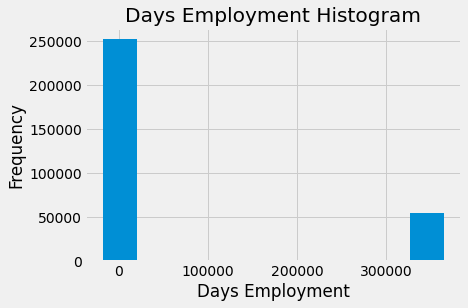

In [ ]:
#The days of employed does not look right
app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

In [ ]:
# Just out of curiousity, let's subset the anomalous clients 
# see if they tend to have higher or low rates of default than the rest of the clients
anom = app_train[app_train['DAYS_EMPLOYED'] == 365243]
non_anom = app_train[app_train['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 55374 anomalous days of employment


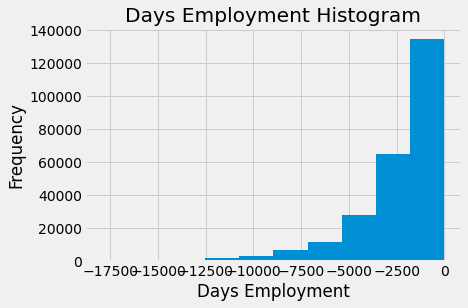

In [ ]:
# Create an anomalous flag column
app_train['DAYS_EMPLOYED_ANOM'] = app_train["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
app_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

In [ ]:
#As an extremely important note, anything we do to the training data we also have to do to the testing data. 
#Let's make sure to create the new column and fill in the existing column with np.nan in the testing data.
app_test['DAYS_EMPLOYED_ANOM'] = app_test["DAYS_EMPLOYED"] == 365243
app_test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

print('There are %d anomalies in the test data out of %d entries' % (app_test["DAYS_EMPLOYED_ANOM"].sum(), len(app_test)))

There are 9274 anomalies in the test data out of 48744 entries


## ADS: Correlation Between Features and the Target

In [ ]:
# Find correlations with the target and sort
correlations = app_train.corr()['TARGET'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 OCCUPATION_TYPE_Laborers                             0.043019
FLAG_DOCUMENT_3                                      0.044346
REG_CITY_NOT_LIVE_CITY                               0.044395
FLAG_EMP_PHONE                                       0.045982
NAME_EDUCATION_TYPE_Secondary / secondary special    0.049824
REG_CITY_NOT_WORK_CITY                               0.050994
DAYS_ID_PUBLISH                                      0.051457
CODE_GENDER_M                                        0.054713
DAYS_LAST_PHONE_CHANGE                               0.055218
NAME_INCOME_TYPE_Working                             0.057481
REGION_RATING_CLIENT                                 0.058899
REGION_RATING_CLIENT_W_CITY                          0.060893
DAYS_EMPLOYED                                        0.074958
DAYS_BIRTH                                           0.078239
TARGET                                               1.000000
Name: TARGET, dtype: float64

Most Negati

## ADS: Effect of Age on Repayment

In [ ]:
# Find the correlation of the positive days since birth and target
app_train['DAYS_BIRTH'] = abs(app_train['DAYS_BIRTH'])
app_train['DAYS_BIRTH'].corr(app_train['TARGET'])

-0.07823930830982694

As the client gets older, there is a negative linear relationship with the target meaning that as clients get older, they tend to repay their loans on time more often.


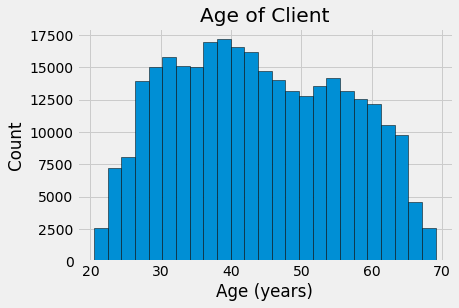

In [ ]:
# Set the style of plots
plt.style.use('fivethirtyeight')

# Plot the distribution of ages in years
plt.hist(app_train['DAYS_BIRTH'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

By itself, the distribution of age does not tell us much other than that there are no outliers as all the ages are reasonable. To visualize the effect of the age on the target, we will next make a kernel density estimation plot (KDE) colored by the value of the target. A kernel density estimate plot shows the distribution of a single variable and can be thought of as a smoothed histogram (it is created by computing a kernel, usually a Gaussian, at each data point and then averaging all the individual kernels to develop a single smooth curve). We will use the seaborn kdeplot for this graph.

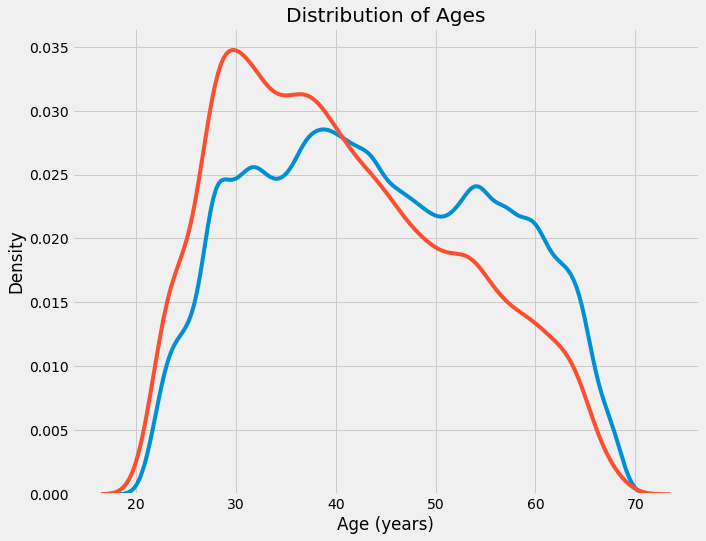

In [ ]:
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, 'DAYS_BIRTH'] / 365, label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, 'DAYS_BIRTH'] / 365, label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');


The target == 1 curve skews towards the younger end of the range. Although this is not a significant correlation (-0.07 correlation coefficient), this variable is likely going to be useful in a machine learning model because it does affect the target. Let's look at this relationship in another way: average failure to repay loans by age bracket.

To make this graph, first we cut the age category into bins of 5 years each. Then, for each bin, we calculate the average value of the target, which tells us the ratio of loans that were not repaid in each age category.

In [ ]:
age_data = app_train[['TARGET', 'DAYS_BIRTH']]
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / 365

# Bin the age data
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,YEARS_BINNED
0,1,9461,25.920548,"(25.0, 30.0]"
1,0,16765,45.931507,"(45.0, 50.0]"
2,0,19046,52.180822,"(50.0, 55.0]"
3,0,19005,52.068493,"(50.0, 55.0]"
4,0,19932,54.608219,"(50.0, 55.0]"
5,0,16941,46.413699,"(45.0, 50.0]"
6,0,13778,37.747945,"(35.0, 40.0]"
7,0,18850,51.643836,"(50.0, 55.0]"
8,0,20099,55.065753,"(55.0, 60.0]"
9,0,14469,39.641096,"(35.0, 40.0]"


In [ ]:
# Group by the bin and calculate averages
age_groups  = age_data.groupby('YEARS_BINNED').mean()
age_groups


,TARGET,DAYS_BIRTH,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.123036,8532.795625,23.377522
"(25.0, 30.0]",0.111436,10155.219250,27.822518
"(30.0, 35.0]",0.102814,11854.848377,32.479037
"(35.0, 40.0]",0.089414,13707.908253,37.555913
"(40.0, 45.0]",0.078491,15497.661233,42.459346
"(45.0, 50.0]",0.074171,17323.900441,47.462741
"(50.0, 55.0]",0.066968,19196.494791,52.593136
"(55.0, 60.0]",0.055314,20984.262742,57.491131
"(60.0, 65.0]",0.052737,22780.547460,62.412459


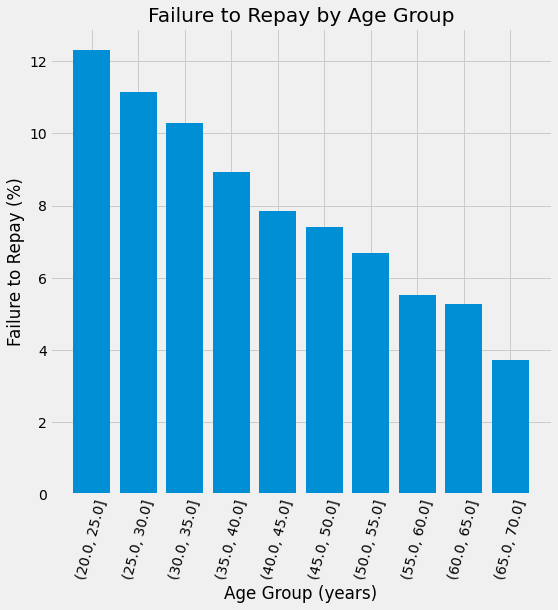

In [ ]:
plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group');

There is a clear trend: younger applicants are more likely to not repay the loan! The rate of failure to repay is above 10% for the youngest three age groups and beolow 5% for the oldest age group.

This is information that could be directly used by the bank: because younger clients are less likely to repay the loan, maybe they should be provided with more guidance or financial planning tips. This does not mean the bank should discriminate against younger clients, but it would be smart to take precautionary measures to help younger clients pay on time.



## ADS: Exterior Sources
The 3 variables with the strongest negative correlations with the target are EXT_SOURCE_1, EXT_SOURCE_2, and EXT_SOURCE_3. According to the documentation, these features represent a "normalized score from external data source". I'm not sure what this exactly means, but it may be a cumulative sort of credit rating made using numerous sources of data.

Let's take a look at these variables.

First, we can show the correlations of the EXT_SOURCE features with the target and with each other.



In [ ]:
print(app_train.columns.to_list())

['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAR

In [ ]:
# Extract the EXT_SOURCE variables and show correlations
ext_data = app_train[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH
TARGET,1.000000,-0.155317,-0.160472,-0.178919,-0.078239
EXT_SOURCE_1,-0.155317,1.000000,0.213982,0.186846,0.600610
EXT_SOURCE_2,-0.160472,0.213982,1.000000,0.109167,0.091996
EXT_SOURCE_3,-0.178919,0.186846,0.109167,1.000000,0.205478
DAYS_BIRTH,-0.078239,0.600610,0.091996,0.205478,1.000000


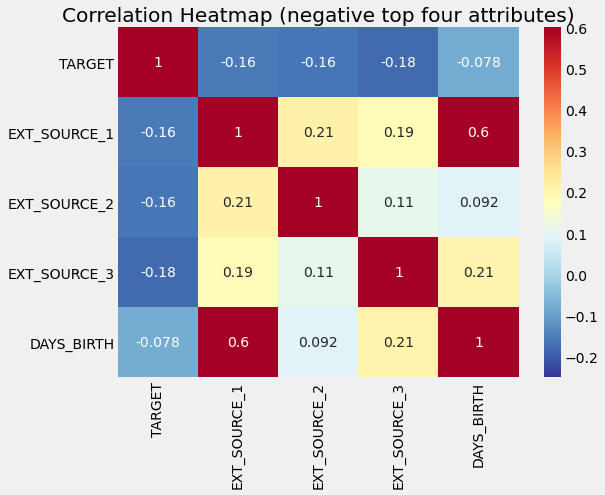

In [ ]:
plt.figure(figsize = (8, 6))

# Heatmap of correlations(negative top four)
sns.heatmap(ext_data_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap (negative top four attributes)');

All three EXT_SOURCE features have negative correlations with the target, indicating that as the value of the EXT_SOURCE increases, the client is more likely to repay the loan. We can also see that DAYS_BIRTH is positively correlated with EXT_SOURCE_1 indicating that maybe one of the factors in this score is the client age.

## Added for report: additional correlation heatmaps between features

In [ ]:
#Top four positive correlated attribute
positive_4_data = app_train[['TARGET', 'DAYS_EMPLOYED', 'REGION_RATING_CLIENT_W_CITY', 'NAME_INCOME_TYPE_Working', 'DAYS_LAST_PHONE_CHANGE']]
positive_4_corrs = positive_4_data.corr()
positive_4_corrs

,TARGET,DAYS_EMPLOYED,REGION_RATING_CLIENT_W_CITY,NAME_INCOME_TYPE_Working,DAYS_LAST_PHONE_CHANGE
TARGET,1.000000,0.074958,0.060893,0.057481,0.055218
DAYS_EMPLOYED,0.074958,1.000000,-0.009311,0.017315,0.141688
REGION_RATING_CLIENT_W_CITY,0.060893,-0.009311,1.000000,0.093937,0.025717
NAME_INCOME_TYPE_Working,0.057481,0.017315,0.093937,1.000000,0.007111
DAYS_LAST_PHONE_CHANGE,0.055218,0.141688,0.025717,0.007111,1.000000


In [ ]:
# correlated attributes - choice features
choice_data = app_train[['TARGET', 'DAYS_BIRTH', 'CODE_GENDER_M', 'AMT_INCOME_TOTAL', 'NAME_EDUCATION_TYPE_Higher education']]
choice_corrs = choice_data.corr()
choice_corrs

,TARGET,DAYS_BIRTH,CODE_GENDER_M,AMT_INCOME_TOTAL,NAME_EDUCATION_TYPE_Higher education
TARGET,1.000000,-0.078239,0.054713,-0.003982,-0.056593
DAYS_BIRTH,-0.078239,1.000000,-0.148060,-0.027261,-0.115808
CODE_GENDER_M,0.054713,-0.148060,1.000000,0.074730,-0.016032
AMT_INCOME_TOTAL,-0.003982,-0.027261,0.074730,1.000000,0.095342
NAME_EDUCATION_TYPE_Higher education,-0.056593,-0.115808,-0.016032,0.095342,1.000000


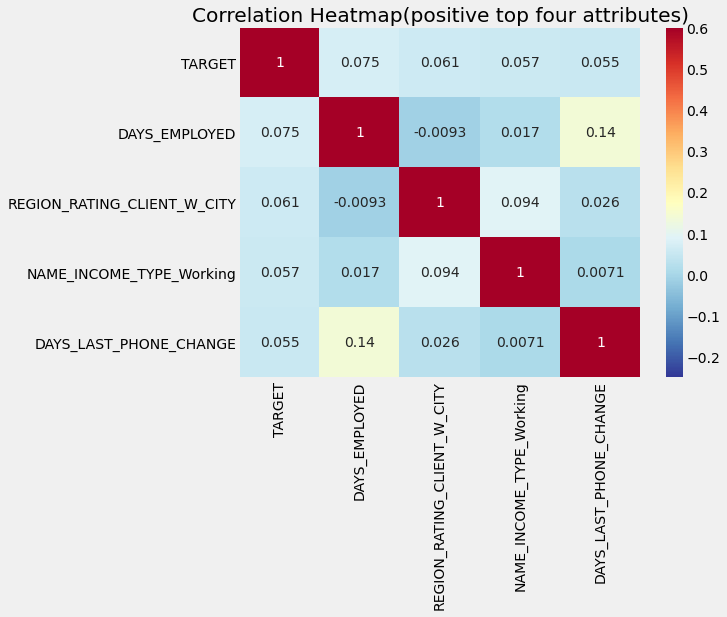

In [ ]:
plt.figure(figsize = (8, 6))

# Heatmap of correlations(postive top four)
sns.heatmap(positive_4_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap(positive top four attributes)');

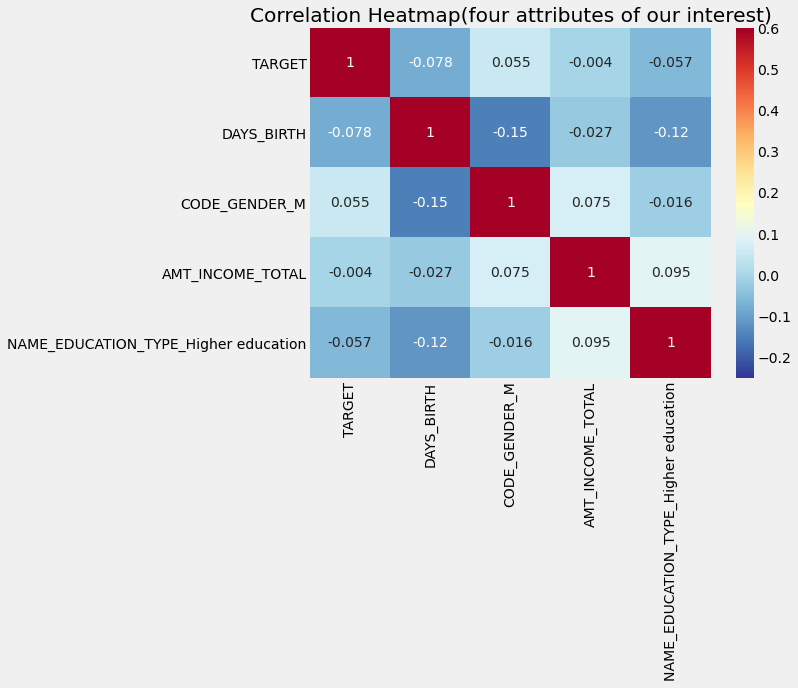

In [ ]:
plt.figure(figsize = (8, 6))

# Heatmap of correlations(choices)
sns.heatmap(choice_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap(four attributes of our interest)');

## ADS: Feature Engineering

Polynomial feature construction

In [ ]:
# Make a new dataframe for polynomial features
poly_features = app_train[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'TARGET']]
poly_features_test = app_test[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]

# imputer for handling missing values
#from sklearn.preprocessing import Imputer
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy = 'median')

poly_target = poly_features['TARGET']

poly_features = poly_features.drop(columns = ['TARGET'])

# Need to impute missing values
poly_features = imputer.fit_transform(poly_features)
poly_features_test = imputer.transform(poly_features_test)

from sklearn.preprocessing import PolynomialFeatures
                                  
# Create the polynomial object with specified degree
poly_transformer = PolynomialFeatures(degree = 3)


In [ ]:
# Train the polynomial features
poly_transformer.fit(poly_features)

# Transform the features
poly_features = poly_transformer.transform(poly_features)
poly_features_test = poly_transformer.transform(poly_features_test)
print('Polynomial Features shape: ', poly_features.shape)

Polynomial Features shape:  (307511, 35)


In [ ]:
poly_transformer.get_feature_names(input_features = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH'])[:15]

['1',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'DAYS_BIRTH',
 'EXT_SOURCE_1^2',
 'EXT_SOURCE_1 EXT_SOURCE_2',
 'EXT_SOURCE_1 EXT_SOURCE_3',
 'EXT_SOURCE_1 DAYS_BIRTH',
 'EXT_SOURCE_2^2',
 'EXT_SOURCE_2 EXT_SOURCE_3',
 'EXT_SOURCE_2 DAYS_BIRTH',
 'EXT_SOURCE_3^2',
 'EXT_SOURCE_3 DAYS_BIRTH',
 'DAYS_BIRTH^2']

There are 35 features with individual features raised to powers up to degree 3 and interaction terms. Now, we can see whether any of these new features are correlated with the target.

In [ ]:
# Create a dataframe of the features 
poly_features = pd.DataFrame(poly_features, 
                             columns = poly_transformer.get_feature_names(['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                                           'EXT_SOURCE_3', 'DAYS_BIRTH']))

# Add in the target
poly_features['TARGET'] = poly_target

# Find the correlations with the target
poly_corrs = poly_features.corr()['TARGET'].sort_values()

# Display most negative and most positive
print(poly_corrs.head(10))
print(poly_corrs.tail(5))

EXT_SOURCE_2 EXT_SOURCE_3                -0.193939
EXT_SOURCE_1 EXT_SOURCE_2 EXT_SOURCE_3   -0.189605
EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH     -0.181283
EXT_SOURCE_2^2 EXT_SOURCE_3              -0.176428
EXT_SOURCE_2 EXT_SOURCE_3^2              -0.172282
EXT_SOURCE_1 EXT_SOURCE_2                -0.166625
EXT_SOURCE_1 EXT_SOURCE_3                -0.164065
EXT_SOURCE_2                             -0.160295
EXT_SOURCE_2 DAYS_BIRTH                  -0.156873
EXT_SOURCE_1 EXT_SOURCE_2^2              -0.156867
Name: TARGET, dtype: float64
DAYS_BIRTH     -0.078239
DAYS_BIRTH^2   -0.076672
DAYS_BIRTH^3   -0.074273
TARGET          1.000000
1                    NaN
Name: TARGET, dtype: float64


In [ ]:
 #Put test features into dataframe
poly_features_test = pd.DataFrame(poly_features_test, 
                                  columns = poly_transformer.get_feature_names(['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                                                'EXT_SOURCE_3', 'DAYS_BIRTH']))

# Merge polynomial features into training dataframe
poly_features['SK_ID_CURR'] = app_train['SK_ID_CURR']
app_train_poly = app_train.merge(poly_features, on = 'SK_ID_CURR', how = 'left')

# Merge polnomial features into testing dataframe
poly_features_test['SK_ID_CURR'] = app_test['SK_ID_CURR']
app_test_poly = app_test.merge(poly_features_test, on = 'SK_ID_CURR', how = 'left')

# Align the dataframes
app_train_poly, app_test_poly = app_train_poly.align(app_test_poly, join = 'inner', axis = 1)

# Print out the new shapes
print('Training data with polynomial features shape: ', app_train_poly.shape)
print('Testing data with polynomial features shape:  ', app_test_poly.shape)

Training data with polynomial features shape:  (307511, 275)
Testing data with polynomial features shape:   (48744, 275)


Domain Knowledge Feature construction

CREDIT_INCOME_PERCENT: the percentage of the credit amount relative to a client's income
ANNUITY_INCOME_PERCENT: the percentage of the loan annuity relative to a client's income
CREDIT_TERM: the length of the payment in months (since the annuity is the monthly amount due
DAYS_EMPLOYED_PERCENT: the percentage of the days employed relative to the client's age

In [ ]:
app_train_domain = app_train.copy()
app_test_domain = app_test.copy()

app_train_domain['CREDIT_INCOME_PERCENT'] = app_train_domain['AMT_CREDIT'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['ANNUITY_INCOME_PERCENT'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['CREDIT_TERM'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_CREDIT']
app_train_domain['DAYS_EMPLOYED_PERCENT'] = app_train_domain['DAYS_EMPLOYED'] / app_train_domain['DAYS_BIRTH']

In [ ]:
app_test_domain['CREDIT_INCOME_PERCENT'] = app_test_domain['AMT_CREDIT'] / app_test_domain['AMT_INCOME_TOTAL']
app_test_domain['ANNUITY_INCOME_PERCENT'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_INCOME_TOTAL']
app_test_domain['CREDIT_TERM'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_CREDIT']
app_test_domain['DAYS_EMPLOYED_PERCENT'] = app_test_domain['DAYS_EMPLOYED'] / app_test_domain['DAYS_BIRTH']

Visualize New Variables: KDE plots

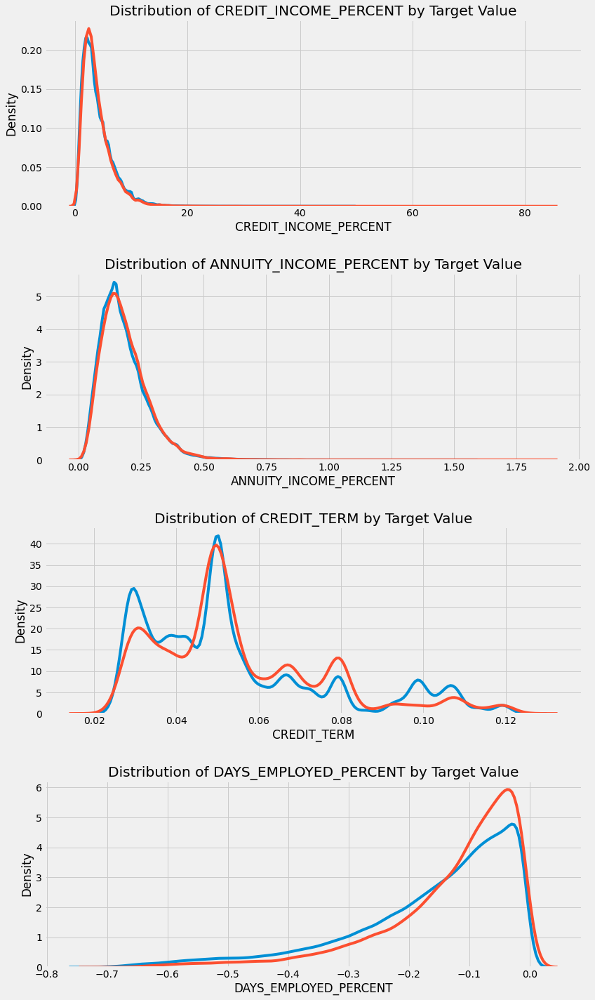

In [ ]:
plt.figure(figsize = (12, 20))
# iterate through the new features
for i, feature in enumerate(['CREDIT_INCOME_PERCENT', 'ANNUITY_INCOME_PERCENT', 'CREDIT_TERM', 'DAYS_EMPLOYED_PERCENT']):
    
    # create a new subplot for each source
    plt.subplot(4, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 0, feature], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 1, feature], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % feature)
    plt.xlabel('%s' % feature); plt.ylabel('Density');
    
plt.tight_layout(h_pad = 2.5)

## ADS: imputation and min-max scaling

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Drop the target from the training data
if 'TARGET' in app_train:
    train = app_train.drop(columns = ['TARGET'])
else:
    train = app_train.copy()
    
# Feature names
features = list(train.columns)

# Copy of the testing data
test = app_test.copy()

# Median imputation of missing values
imputer = SimpleImputer(strategy = 'median')

# Scale each feature to 0-1
scaler = MinMaxScaler(feature_range = (0, 1))

# Fit on the training data
imputer.fit(train)

# Transform both training and testing data
train = imputer.transform(train)
test = imputer.transform(app_test)

# Repeat with the scaler
scaler.fit(train)
train = scaler.transform(train)
test = scaler.transform(test)

print('Training data shape: ', train.shape)
print('Testing data shape: ', test.shape)

Training data shape:  (307511, 240)
Testing data shape:  (48744, 240)


# ADS implementation: Random Forest with original and domain knowledge features

Original features AUC: 0.678

Original + polynomial features AUC: 0.678

In [ ]:
from sklearn.ensemble import RandomForestClassifier

app_train_domain_drop = app_train_domain.drop(columns = 'TARGET')

domain_features_names = list(app_train_domain_drop.columns)

# Impute the domainnomial features
imputer = SimpleImputer(strategy = 'median')

domain_features = imputer.fit_transform(app_train_domain_drop)
domain_features_test = imputer.transform(app_test_domain)

# Scale the domainnomial features
scaler = MinMaxScaler(feature_range = (0, 1))

domain_features = scaler.fit_transform(domain_features)
domain_features_test = scaler.transform(domain_features_test)

random_forest_domain = RandomForestClassifier(n_estimators = 100, random_state = 50, verbose = 1, n_jobs = -1)

# Train on the training data
random_forest_domain.fit(domain_features, train_labels)

# Extract feature importances
feature_importance_values_domain = random_forest_domain.feature_importances_
feature_importances_domain = pd.DataFrame({'feature': domain_features_names, 'importance': feature_importance_values_domain})

# Make predictions on the test data
predictions = random_forest_domain.predict_proba(domain_features_test)[:, 1]

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   36.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.4min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.8s finished


In [ ]:
# Make a submission dataframe
submit = app_test[['SK_ID_CURR']]
submit['TARGET'] = predictions

# Save the submission dataframe
submit.to_csv('random_forest_baseline_domain.csv', index = False)

Feature Importances:

As a simple method to see which variables are the most relevant, we can look at the feature importances of the random forest. Given the correlations we saw in the exploratory data analysis, we should expect that the most important features are the EXT_SOURCE and the DAYS_BIRTH. We may use these feature importances as a method of dimensionality reduction in future work.

In [ ]:
def plot_feature_importances(df):
    """
    Plot importances returned by a model. This can work with any measure of
    feature importance provided that higher importance is better. 
    
    Args:
        df (dataframe): feature importances. Must have the features in a column
        called `features` and the importances in a column called `importance
        
    Returns:
        shows a plot of the 15 most importance features
        
        df (dataframe): feature importances sorted by importance (highest to lowest) 
        with a column for normalized importance
        """
    
    # Sort features according to importance
    df = df.sort_values('importance', ascending = False).reset_index()
    
    # Normalize the feature importances to add up to one
    df['importance_normalized'] = df['importance'] / df['importance'].sum()

    # Make a horizontal bar chart of feature importances
    plt.figure(figsize = (10, 6))
    ax = plt.subplot()
    
    # Need to reverse the index to plot most important on top
    ax.barh(list(reversed(list(df.index[:15]))), 
            df['importance_normalized'].head(15), 
            align = 'center', edgecolor = 'k')
    
    # Set the yticks and labels
    ax.set_yticks(list(reversed(list(df.index[:15]))))
    ax.set_yticklabels(df['feature'].head(15))

    # Plot labeling
    plt.xlabel('Normalized Importance'); plt.title('Feature Importances')
    plt.show()
    
    return df

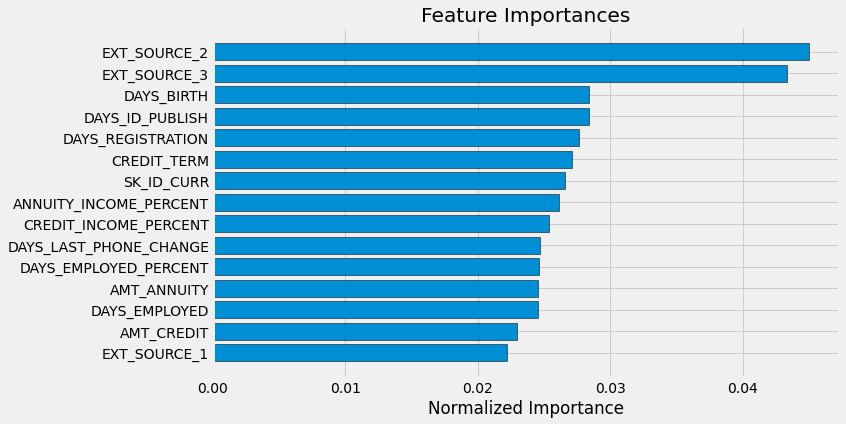

In [ ]:
# Show the feature importances for the default features
feature_importances_sorted = plot_feature_importances(feature_importances_domain)

# Accuracy and Fairness of the ADS

In [ ]:
!pip install aif360==0.3.0 
!pip install BlackBoxAuditing
!pip install tensorflow==1.12.0
import matplotlib.pyplot as plt 

import random
random.seed(6)

import sys
import warnings

import numpy as np
import pandas as pd
import tensorflow as tf

from tqdm import tqdm

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split

from aif360.algorithms.preprocessing import DisparateImpactRemover
from aif360.algorithms.inprocessing import AdversarialDebiasing
from aif360.algorithms.inprocessing.meta_fair_classifier import MetaFairClassifier
import BlackBoxAuditing
from aif360.algorithms.preprocessing import Reweighing
from aif360.datasets import CompasDataset, AdultDataset, StandardDataset, BankDataset, GermanDataset
from aif360.metrics import BinaryLabelDatasetMetric, ClassificationMetric
from aif360.algorithms.postprocessing import EqOddsPostprocessing
from aif360.algorithms.preprocessing.optim_preproc_helpers.data_preproc_functions import load_preproc_data_adult


from aif360.algorithms.inprocessing import GerryFairClassifier
from aif360.algorithms.inprocessing import PrejudiceRemover

from sklearn.preprocessing import MinMaxScaler
from aif360.metrics import BinaryLabelDatasetMetric

from aif360.algorithms.postprocessing.reject_option_classification import RejectOptionClassification
import seaborn as sns

%matplotlib inline


     |████████████████████████████████| 174kB 5.8MB/s 
     |████████████████████████████████| 2.6MB 4.3MB/s 
  Created wheel for BlackBoxAuditing: filename=BlackBoxAuditing-0.1.54-py2.py3-none-any.whl size=1394769 sha256=b24195d080ed64e4f612984c7e3dbff3b890c949ad69502f0f5301cecc4c18f7
  Stored in directory: /root/.cache/pip/wheels/66/82/7b/ac2a79b8caf97e15ed415162a7f272cbba1e2e2c851fa76ae3
Successfully built BlackBoxAuditing
ERROR: Could not find a version that satisfies the requirement tensorflow==1.12.0 (from versions: 1.13.0rc1, 1.13.0rc2, 1.13.1, 1.13.2, 1.14.0rc0, 1.14.0rc1, 1.14.0, 1.15.0rc0, 1.15.0rc1, 1.15.0rc2, 1.15.0rc3, 1.15.0, 1.15.2, 1.15.3, 1.15.4, 1.15.5, 2.0.0a0, 2.0.0b0, 2.0.0b1, 2.0.0rc0, 2.0.0rc1, 2.0.0rc2, 2.0.0, 2.0.1, 2.0.2, 2.0.3, 2.0.4, 2.1.0rc0, 2.1.0rc1, 2.1.0rc2, 2.1.0, 2.1.1, 2.1.2, 2.1.3, 2.2.0rc0, 2.2.0rc1, 2.2.0rc2, 2.2.0rc3, 2.2.0rc4, 2.2.0, 2.2.1, 2.2.2, 2.3.0rc0, 2.3.0rc1, 2.3.0rc2, 2.3.0, 2.3.1, 2.3.2, 2.4.0rc0, 2.4.0rc1, 2.4.0rc2, 2.4.0rc3, 2.4.0rc4

pip install 'aif360[LFR]'


In [ ]:
# change DAYS_BIRTH into years;
# variable name is a bit misleading now,
# but we don't want to add another column to the data
app_train_domain['DAYS_BIRTH'] = app_train_domain['DAYS_BIRTH']/365

# find thresholds for privileged/unprivileged groups
# based on median/mean of age and income

age_med = app_train_domain['DAYS_BIRTH'].median()
age_mean = app_train_domain['DAYS_BIRTH'].mean()
print(age_med, age_mean)

income_med = app_train_domain['AMT_INCOME_TOTAL'].median()
income_mean = app_train_domain['AMT_INCOME_TOTAL'].mean()
print(income_med, income_mean)

43.15068493150685 43.936972785870296
147150.0 168797.9192969845


In [ ]:
'''
# set up the training and testing set
# define previleged and unprevileged group

single_protected = ['sex']
single_privileged = [['Male']]
ad = AdultDataset(protected_attribute_names=single_protected,
privileged_classes=single_privileged, features_to_drop=['race',"age"])
print(ad.feature_names)
print(ad.label_names)
#split the original data to test and training group
ad_train, ad_test = ad.split([0.8], shuffle=True)

'''
# we have to split the original training set into new train/test sets
# since we need the true target values of the test set 
# in order to evaluate fairness/accuracy.

# make copies of training data for each sensitive feature
data_age = app_train_domain.copy()
data_gender = app_train_domain.copy()
data_income = app_train_domain.copy()

# change the sensitive feature into binary variable
# in its respective copy of the data
# thresholds for numerical sensitive features = approx. median

# DAYS_BIRTH (age)
# age greater than or equal to 43 years = 1
# age less than 43 years = 0
data_age['DAYS_BIRTH'] = (data_age['DAYS_BIRTH']>=43).astype(int)
privileged_age = [{'DAYS_BIRTH': 1}]
unprivileged_age = [{'DAYS_BIRTH': 0}]

# CODE_GENDER_M (gender) column is already binary:
# male = 1, female = 0
privileged_gender = [{'CODE_GENDER_M': 1}]
unprivileged_gender = [{'CODE_GENDER_M': 0}]

# AMT_INCOME_TOTAL (income)
# income greater than or equal to 147150 = 1
# income less than 147150 = 0
data_income['AMT_INCOME_TOTAL'] = (data_income['AMT_INCOME_TOTAL']>=147150).astype(int)
privileged_income = [{'AMT_INCOME_TOTAL': 1}]
unprivileged_income = [{'AMT_INCOME_TOTAL': 0}]

In [ ]:
# Re-split training data into training and test sets
age_train, age_test = train_test_split(data_age, random_state = 1, shuffle=True, train_size=0.8)
gender_train, gender_test = train_test_split(data_gender, random_state = 1, shuffle=True, train_size=0.8)
income_train, income_test = train_test_split(data_income, random_state = 1, shuffle=True, train_size=0.8)

In [ ]:
# Check new train/test set sizes
print("Original one hot encoded train set: ", len(app_train_domain))
print("Train dataset shape: ", len(age_train['TARGET']))
print("Test dataset shape: ", len(age_test["TARGET"]))

Original one hot encoded train set:  307511
Train dataset shape:  246008
Test dataset shape:  61503


In [ ]:
# keep original classes for training data
age_train_labels = age_train['TARGET']
gender_train_labels = gender_train['TARGET']
income_train_labels = income_train['TARGET']

In [ ]:
# Retrain model: age
age_train = age_train.drop(columns = 'TARGET')
age_test_dropped = age_test.drop(columns='TARGET')
age_features_names = list(age_train.columns)

# Impute features with median
imputer = SimpleImputer(strategy = 'median')
age_features = imputer.fit_transform(age_train)
age_features_test = imputer.transform(age_test_dropped)

# Scale features
scaler = MinMaxScaler(feature_range = (0, 1))
age_features = scaler.fit_transform(age_features)
age_features_test = scaler.transform(age_features_test)

# Model
random_forest_age = RandomForestClassifier(n_estimators = 100, random_state = 50, verbose = 1, n_jobs = -1)

# Train on the training data
random_forest_age.fit(age_features, age_train_labels)

# Extract feature importances
feature_importance_values_age = random_forest_age.feature_importances_
feature_importances_age = pd.DataFrame({'feature': age_features_names, 'importance': feature_importance_values_age})

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   29.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished


In [ ]:
# Retrain model: gender
gender_train = gender_train.drop(columns = 'TARGET')
gender_test_dropped = age_test.drop(columns='TARGET')
gender_features_names = list(gender_train.columns)

# Impute features with median
imputer = SimpleImputer(strategy = 'median')
gender_features = imputer.fit_transform(gender_train)
gender_features_test = imputer.transform(gender_test_dropped)

# Scale features
scaler = MinMaxScaler(feature_range = (0, 1))
gender_features = scaler.fit_transform(gender_features)
gender_features_test = scaler.transform(gender_features_test)

# Model
random_forest_gender = RandomForestClassifier(n_estimators = 100, random_state = 50, verbose = 1, n_jobs = -1)

# Train on the training data
random_forest_gender.fit(age_features, gender_train_labels)

# Extract feature importances
feature_importance_values_gender = random_forest_gender.feature_importances_
feature_importances_gender = pd.DataFrame({'feature': gender_features_names, 'importance': feature_importance_values_gender})

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   28.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished


In [ ]:
# Retrain model: income
income_train = income_train.drop(columns = 'TARGET')
income_test_dropped = age_test.drop(columns='TARGET')
income_features_names = list(income_train.columns)

# Impute features with median
imputer = SimpleImputer(strategy = 'median')
income_features = imputer.fit_transform(income_train)
income_features_test = imputer.transform(income_test_dropped)

# Scale features
scaler = MinMaxScaler(feature_range = (0, 1))
income_features = scaler.fit_transform(income_features)
income_features_test = scaler.transform(income_features_test)

# Model
random_forest_income = RandomForestClassifier(n_estimators = 100, random_state = 50, verbose = 1, n_jobs = -1)

# Train on the training data
random_forest_income.fit(income_features, income_train_labels)

# Extract feature importances
feature_importance_values_income = random_forest_income.feature_importances_
feature_importances_income = pd.DataFrame({'feature': income_features_names, 'importance': feature_importance_values_income})

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   27.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.0min finished


In [ ]:
# Make predictions on the test data
# and set up test data for accuracy/fairness metric functions
age_test_features = age_test.drop("TARGET", axis=1)
age_test_true = age_test['TARGET']
age_test_pred_prob = random_forest_age.predict_proba(age_features_test)[:, 1]
age_test_pred = random_forest_age.predict(age_features_test)

gender_test_features = gender_test.drop("TARGET", axis=1)
gender_test_true = gender_test['TARGET']
gender_test_pred_prob = random_forest_gender.predict_proba(gender_features_test)[:, 1]
gender_test_pred = random_forest_gender.predict(gender_features_test)

income_test_features = income_test.drop("TARGET", axis=1)
income_test_true = income_test['TARGET']
income_test_pred_prob = random_forest_income.predict_proba(income_features_test)[:, 1]
income_test_pred = random_forest_income.predict(income_features_test)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    1.2s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    1.3s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    1.1s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    1.1s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.4s
[Parallel(n_job

In [ ]:
# Example of inputs:
# age_test_true, age_test_pred, age_test_pred_prob
def evaluate_accuracy(y_true, y_pred, y_pred_prob):
    '''Calculates the AUC and accuracy for a trained logistic regression model'''
    
    # Calculate accuracy
    accuracy = accuracy_score(y_true, y_pred)
    
    # Calculate AUC
    auc = roc_auc_score(y_true, y_pred_prob)
    
    return accuracy, auc

In [ ]:
# define a function to calculate metrics of interest:
# (1) overall accuracy, (2) accuracy for the privileged group, 
# (3) accuracy for the unprivileged group,
# (4) disparate impact, (5) false positive rate difference,
# (6) false negative rate difference

# Example of inputs:
# age_test, 'DAYS_BIRTH', privileged_age, unprivileged_age, age_test_features, age_test_pred
def evaluate_metrics(test_orig, sensitive_feature, priv_group, unpriv_group, x_test, y_pred):

    # Convert predictions to aif360 object
    test_pred = test_orig.copy()
    test_pred['TARGET'] = y_pred
    # original   
    test_orig_aif360 = StandardDataset(test_orig, label_name='TARGET', favorable_classes=[1],
                                       protected_attribute_names=[sensitive_feature], privileged_classes = [[1]])
    # predictions
    test_pred_aif360 = StandardDataset(test_pred, label_name='TARGET', favorable_classes=[1], 
                                       protected_attribute_names=[sensitive_feature], privileged_classes = [[1]])
    
    # ClassificationMetric
    test_orig_vs_preds_metrics = ClassificationMetric(test_orig_aif360, test_pred_aif360,
                                                   unprivileged_groups=unpriv_group,
                                                   privileged_groups=priv_group)
    
    # BinaryLabelDatasetMetric
    metric_test_pred = BinaryLabelDatasetMetric(
          test_pred_aif360, 
          unprivileged_groups=unpriv_group,
          privileged_groups=priv_group)

    # Calculate accuracy
    accuracy = test_orig_vs_preds_metrics.accuracy()
    
    # Calculate accuracy for privileged group
    privileged_accuracy = test_orig_vs_preds_metrics.accuracy(privileged=True)

    # Calculate accuracy for unprivileged group
    unprivileged_accuracy = test_orig_vs_preds_metrics.accuracy(privileged=False)
  
    # Calculate disparate impact
    disparate_impact = metric_test_pred.disparate_impact()

    # Calculate false positive rate difference
    fp_rate_diff = test_orig_vs_preds_metrics.false_positive_rate_difference()

    # Calculate false negative rate difference
    fn_rate_diff = test_orig_vs_preds_metrics.false_negative_rate_difference()
    
    return accuracy, privileged_accuracy, unprivileged_accuracy, disparate_impact, fp_rate_diff, fn_rate_diff

In [ ]:
# Calculate the overall accuracy/auc of each model

print("Models trained with sensitive attributes changed to binary variables")

print("\nSensitive attribute = age:")
accuracy_age, auc_age = evaluate_accuracy(age_test_true, age_test_pred, age_test_pred_prob)
print("Overall Accuracy:", accuracy_age)
print("AUC:", auc_age)

print("\nSensitive attribute = gender:")
accuracy_gender, auc_gender = evaluate_accuracy(gender_test_true, gender_test_pred, gender_test_pred_prob)
print("Overall Accuracy:", accuracy_gender)
print("AUC:", auc_gender)

print("\nSensitive attribute = income amount:")
accuracy_income, auc_income = evaluate_accuracy(income_test_true, income_test_pred, income_test_pred_prob)
print("Overall Accuracy:", accuracy_income)
print("AUC:", auc_income)

Models trained with sensitive attributes changed to binary variables

Sensitive attribute = age:
Overall Accuracy: 0.9193047493618197
AUC: 0.7194548110483787

Sensitive attribute = gender:
Overall Accuracy: 0.9192884899923581
AUC: 0.7152640677347298

Sensitive attribute = income amount:
Overall Accuracy: 0.9193210087312814
AUC: 0.6947867524607073


In [ ]:
# fill nan values with median
age_train = age_train.fillna(age_train.median())
age_test = age_test.fillna(age_test.median())
gender_train = gender_train.fillna(gender_train.median())
gender_test = gender_test.fillna(gender_test.median())
income_train = income_train.fillna(income_train.median())
income_test = income_test.fillna(income_test.median())

In [ ]:
# Calculate group accuracy/fairness metrics
acc_age, priv_acc_age, unpriv_acc_age, disp_impact_age, fp_rate_diff_age, fn_rate_diff_age = evaluate_metrics (age_test, 
                                                                                                              'DAYS_BIRTH', 
                                                                                                              privileged_age, 
                                                                                                              unprivileged_age, 
                                                                                                              age_test_features, 
                                                                                                              age_test_pred)

acc_gender, priv_acc_gender, unpriv_acc_gender, disp_impact_gender, fp_rate_diff_gender, fn_rate_diff_gender = evaluate_metrics (gender_test, 
                                                                                                              'CODE_GENDER_M', 
                                                                                                              privileged_gender, 
                                                                                                              unprivileged_gender, 
                                                                                                              gender_test_features, 
                                                                                                              gender_test_pred)

acc_income, priv_acc_income, unpriv_acc_income, disp_impact_income, fp_rate_diff_income, fn_rate_diff_income = evaluate_metrics (income_test, 
                                                                                                              'AMT_INCOME_TOTAL', 
                                                                                                              privileged_income, 
                                                                                                              unprivileged_income, 
                                                                                                              income_test_features, 
                                                                                                              income_test_pred)


In [ ]:
age_metrics = {'Overall accuracy':  [acc_age],
        'Privileged group accuracy': [priv_acc_age],
        'Unprivileged group accuracy': [unpriv_acc_age],
        'Disparate impact': [disp_impact_age],
        'FP rate difference': [fp_rate_diff_age],
        'FN rate difference': [fn_rate_diff_age]
        }

df_age_metrics = pd.DataFrame(age_metrics, columns = ['Overall accuracy',
                                                      'Privileged group accuracy',
                                                      'Unprivileged group accuracy',
                                                      'Disparate impact',
                                                      'FP rate difference',
                                                      'FN rate difference'])
print("Metrics for sensitive attribute age:")
df_age_metrics

Metrics for sensitive attribute age:


,Overall accuracy,Privileged group accuracy,Unprivileged group accuracy,Disparate impact,FP rate difference,FN rate difference
0,0.919305,0.93736,0.901104,8.064516,0.000036,-0.00179


In [ ]:
gender_metrics = {'Overall accuracy':  [acc_gender],
        'Privileged group accuracy': [priv_acc_gender],
        'Unprivileged group accuracy': [unpriv_acc_gender],
        'Disparate impact': [disp_impact_gender],
        'FP rate difference': [fp_rate_diff_gender],
        'FN rate difference': [fn_rate_diff_gender]
        }

df_gender_metrics = pd.DataFrame(gender_metrics, columns = ['Overall accuracy',
                                                      'Privileged group accuracy',
                                                      'Unprivileged group accuracy',
                                                      'Disparate impact',
                                                      'FP rate difference',
                                                      'FN rate difference'])
print("Metrics for sensitive attribute gender:")
df_gender_metrics

Metrics for sensitive attribute gender:


,Overall accuracy,Privileged group accuracy,Unprivileged group accuracy,Disparate impact,FP rate difference,FN rate difference
0,0.919288,0.897438,0.930683,0.347657,-0.000026,0.001239


In [ ]:
income_metrics = {'Overall accuracy':  [acc_income],
        'Privileged group accuracy': [priv_acc_income],
        'Unprivileged group accuracy': [unpriv_acc_income],
        'Disparate impact': [disp_impact_income],
        'FP rate difference': [fp_rate_diff_income],
        'FN rate difference': [fn_rate_diff_income]
        }

df_income_metrics = pd.DataFrame(income_metrics, columns = ['Overall accuracy',
                                                      'Privileged group accuracy',
                                                      'Unprivileged group accuracy',
                                                      'Disparate impact',
                                                      'FP rate difference',
                                                      'FN rate difference'])
print("Metrics for sensitive attribute income:")
df_income_metrics

Metrics for sensitive attribute income:


,Overall accuracy,Privileged group accuracy,Unprivileged group accuracy,Disparate impact,FP rate difference,FN rate difference
0,0.919321,0.922877,0.915758,2.337966,0.000036,-0.001052


# Other ADS Properties: LIME

In [ ]:
!pip install lime

     |████████████████████████████████| 276kB 4.7MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-cp37-none-any.whl size=283846 sha256=5f7b06844de248f16a07931889af75f508eb3d049acda3d09fe46cab7294de55
  Stored in directory: /root/.cache/pip/wheels/4c/4f/a5/0bc765457bd41378bf3ce8d17d7495369d6e7ca3b712c60c89
Successfully built lime


In [ ]:
%matplotlib inline

import sklearn.model_selection
import sklearn.metrics
import sklearn.datasets
import sklearn.ensemble
import sklearn.preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import numpy as np
from IPython.display import Markdown, display
import matplotlib.pyplot as plt
import warnings
import lime
import lime.lime_tabular
from lime import submodular_pick
import xgboost
from xgboost import plot_importance
import json
from collections import OrderedDict

import pandas as pd

np.random.seed(1)

In [ ]:
# Need to get data in a format that LIME wants it.
# Reload training data
lime_data = pd.read_csv('application_train.csv')
print(lime_data.shape)

# Add in domain features again
lime_data['CREDIT_INCOME_PERCENT'] = lime_data['AMT_CREDIT'] / lime_data['AMT_INCOME_TOTAL']
lime_data['ANNUITY_INCOME_PERCENT'] = lime_data['AMT_ANNUITY'] / lime_data['AMT_INCOME_TOTAL']
lime_data['CREDIT_TERM'] = lime_data['AMT_ANNUITY'] / lime_data['AMT_CREDIT']
lime_data['DAYS_EMPLOYED_PERCENT'] = lime_data['DAYS_EMPLOYED'] / lime_data['DAYS_BIRTH']
print(lime_data.shape)

(307511, 122)
(307511, 126)


In [ ]:
# Fill nan values with median
lime_data = lime_data.fillna(lime_data.median())

In [ ]:
# Get list of feature names except for target column
lime_data_dropped = lime_data.drop(columns='TARGET')
feature_names = lime_data_dropped.columns

In [ ]:
# Mark labels and encode them using sklearn
# Our labels are already 0, 1 but running this to ensure later code works
labels = lime_data.iloc[:,1]
le= sklearn.preprocessing.LabelEncoder()
le.fit(labels)
labels = le.transform(labels)
class_names = le.classes_
lime_features = lime_data_dropped.iloc[:,]
le_label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Class names: ", class_names)
print("Label mapping: ", le_label_mapping)

Class names:  [0 1]
Label mapping:  {0: 0, 1: 1}


In [ ]:
# Check categorical varibles to make dummies for
print(lime_features.dtypes)
# Get a list of which variables are categorical
categorical_features  = [i for i in range(len(lime_features.dtypes)) if lime_features.dtypes[i]=='object']
print("Indices of categorical features: ", categorical_features)

SK_ID_CURR                      int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
FLAG_OWN_REALTY                object
                               ...   
AMT_REQ_CREDIT_BUREAU_YEAR    float64
CREDIT_INCOME_PERCENT         float64
ANNUITY_INCOME_PERCENT        float64
CREDIT_TERM                   float64
DAYS_EMPLOYED_PERCENT         float64
Length: 125, dtype: object
Indices of categorical features:  [1, 2, 3, 4, 10, 11, 12, 13, 14, 27, 31, 39, 85, 86, 88, 89]


In [ ]:
categorical_names = {}
for feature in categorical_features:
    print("Feature: ", feature)
    # Cast all values in categorical columns to strings
    lime_features.iloc[:,feature] = lime_features.iloc[:,feature].astype(str)
    # Use label encoder to map categories to numbers
    le = sklearn.preprocessing.LabelEncoder()
    le.fit(lime_features.iloc[:, feature])
    # Replace the categories with corresponding numbers in the original data
    lime_features.iloc[:, feature] = le.transform(lime_features.iloc[:, feature])
    # Store and print the mappings for reference later
    categorical_names[feature] = le.classes_
    print(categorical_names[feature])
    print("==================================================")

Feature:  1
['Cash loans' 'Revolving loans']
Feature:  2
['F' 'M' 'XNA']
Feature:  3
['N' 'Y']
Feature:  4
['N' 'Y']
Feature:  10
['Children' 'Family' 'Group of people' 'Other_A' 'Other_B'
 'Spouse, partner' 'Unaccompanied' 'nan']
Feature:  11
['Businessman' 'Commercial associate' 'Maternity leave' 'Pensioner'
 'State servant' 'Student' 'Unemployed' 'Working']
Feature:  12
['Academic degree' 'Higher education' 'Incomplete higher'
 'Lower secondary' 'Secondary / secondary special']
Feature:  13
['Civil marriage' 'Married' 'Separated' 'Single / not married' 'Unknown'
 'Widow']
Feature:  14
['Co-op apartment' 'House / apartment' 'Municipal apartment'
 'Office apartment' 'Rented apartment' 'With parents']
Feature:  27
['Accountants' 'Cleaning staff' 'Cooking staff' 'Core staff' 'Drivers'
 'HR staff' 'High skill tech staff' 'IT staff' 'Laborers'
 'Low-skill Laborers' 'Managers' 'Medicine staff' 'Private service staff'
 'Realty agents' 'Sales staff' 'Secretaries' 'Security staff'
 'Waiters/b

In [ ]:
categorical_names

{1: array(['Cash loans', 'Revolving loans'], dtype=object),
 2: array(['F', 'M', 'XNA'], dtype=object),
 3: array(['N', 'Y'], dtype=object),
 4: array(['N', 'Y'], dtype=object),
 10: array(['Children', 'Family', 'Group of people', 'Other_A', 'Other_B',
        'Spouse, partner', 'Unaccompanied', 'nan'], dtype=object),
 11: array(['Businessman', 'Commercial associate', 'Maternity leave',
        'Pensioner', 'State servant', 'Student', 'Unemployed', 'Working'],
       dtype=object),
 12: array(['Academic degree', 'Higher education', 'Incomplete higher',
        'Lower secondary', 'Secondary / secondary special'], dtype=object),
 13: array(['Civil marriage', 'Married', 'Separated', 'Single / not married',
        'Unknown', 'Widow'], dtype=object),
 14: array(['Co-op apartment', 'House / apartment', 'Municipal apartment',
        'Office apartment', 'Rented apartment', 'With parents'],
       dtype=object),
 27: array(['Accountants', 'Cleaning staff', 'Cooking staff', 'Core staff',
     

In [ ]:
# Use this encoder function to transform the categorical columns into dummies: 
# don't do this to original dataset if we want to use LIME
encoder = ColumnTransformer(transformers=[('get_dummies', OneHotEncoder(), categorical_features)], remainder='passthrough')
encoder = encoder.fit(lime_features)

In [ ]:
lime_data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,...,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,CREDIT_INCOME_PERCENT,ANNUITY_INCOME_PERCENT,CREDIT_TERM,DAYS_EMPLOYED_PERCENT
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,9.0,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,...,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,2.007889,0.121978,0.060749,0.067329
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,9.0,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,...,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.790750,0.132217,0.027598,0.070862
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,...,NaN,NaN,0.0688,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.000000,0.100000,0.050000,0.011814
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,9.0,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,...,NaN,NaN,0.0688,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,2.316167,0.219900,0.094941,0.159905
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,9.0,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,...,NaN,NaN,0.0688,NaN,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.222222,0.179963,0.042623,0.152418
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,225000.0,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,0.032561,-9327,

In [ ]:
# Resplit training data into new train/test sets
lime_train, lime_test, lime_train_labels, lime_test_labels = train_test_split(lime_features, labels, random_state = 1, shuffle=True, train_size=0.8)
print("Train shape:", lime_train.shape)
print("Test shape:", lime_test.shape)

Train shape: (246008, 125)
Test shape: (61503, 125)


In [ ]:
# Train model
lime_features_names = list(lime_train.columns)

# Encode training set
lime_features_encoded = encoder.transform(lime_train)

# Model
random_forest_lime = RandomForestClassifier(n_estimators = 100, random_state = 50, verbose = 1, n_jobs = -1)

# Train on the training data
random_forest_lime.fit(lime_features_encoded, lime_train_labels)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   26.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.0min finished


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=50, verbose=1,
                       warm_start=False)

In [ ]:
# Make predictions 
lime_pred_labels = random_forest_lime.predict(encoder.transform(lime_test))

# Calculate accuracy on the test set
print("Test set accuracy: ", sklearn.metrics.accuracy_score(lime_test_labels, lime_pred_labels))

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.4s


Test set accuracy:  0.9192397118839731


[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    1.0s finished


In [ ]:
# LIME Tabular Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(lime_train.values, 
                                                   feature_names=feature_names,
                                                   class_names=class_names,
                                                   categorical_features=categorical_features, 
                                                   categorical_names=categorical_names)

In [ ]:
predict_fn = lambda x: random_forest_lime.predict_proba(encoder.transform(x)).astype(float)

In [ ]:
# Submodular picker
# Initialize the SP object
sp_obj = submodular_pick.SubmodularPick(explainer, lime_train.values, predict_fn, sample_size=10, 
                                        num_features=5, num_exps_desired=5)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_job

In [ ]:
sp_obj.V

[0, 8, 1, 4, 7]

In [ ]:
for ind in sp_obj.V:
    exp = explainer.explain_instance(lime_test.values[ind], predict_fn, num_features=5)
    print("Actual class: ", lime_test_labels[ind])
    exp.show_in_notebook(show_all=False)
    print("==========================")

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.2s finished


Actual class:  1


[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.2s finished


Actual class:  0


[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished


Actual class:  0


[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.2s finished


Actual class:  0


[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.2s finished


Actual class:  0


In [ ]:
# index 0 was misclassified: look in more detail
print('Actual class: ', lime_test_labels[0])
# Get explanation
exp0 = explainer.explain_instance((lime_test.values[0]), predict_fn, num_features=10)
exp0.show_in_notebook(show_all=True)

Actual class:  1


[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.2s finished
